<a href="https://colab.research.google.com/github/MJAHMADEE/Yolov8_Track_Coordinates_Center/blob/main/Tracking_Centers_YOLOv8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [1]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [ ]:
# %cd {HOME}
# !wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1pz68D1Gsx80MoPg-_q-IbEdESEmyVLm-' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1pz68D1Gsx80MoPg-_q-IbEdESEmyVLm-" -O vehicle-counting.mp4 && rm -rf /tmp/cookies.txt

In [23]:
!pip install --upgrade --no-cache-dir gdown
!gdown 1KPP6SpKMf3Ts4Itbg8Rt6U3N-vNlDHvU
# https://drive.google.com/file/d/1KPP6SpKMf3Ts4Itbg8Rt6U3N-vNlDHvU/view?usp=sharing

  Attempting uninstall: gdown
    Found existing installation: gdown 4.6.6
    Uninstalling gdown-4.6.6:
      Successfully uninstalled gdown-4.6.6
Downloading...
From: https://drive.google.com/uc?id=1KPP6SpKMf3Ts4Itbg8Rt6U3N-vNlDHvU
To: /content/ByteTrack/TestVideo.mp4
100% 229k/229k [00:00<00:00, 148MB/s]


In [2]:
SOURCE_VIDEO_PATH ="/content/TestVideo.mp4"

In [3]:
# Pip install method (recommended)

!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.135 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (4 CPUs, 25.5 GB RAM, 24.2/166.8 GB disk)


In [4]:
!pip install loguru

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.0/60.0 kB 2.6 MB/s eta 0:00:00


In [5]:
!pip install yolox

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.0/80.0 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.0/146.0 kB 8.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.2/5.2 MB 67.6 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
  Preparing metadata (pyproject.toml) ... done
INFO: pip is looking at multiple versions of yolox to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 kB 8.8 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encounter

In [6]:
!pip install thop

  Using cached thop-0.1.1.post2209072238-py3-none-any.whl (15 kB)


In [7]:
!pip install lap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 19.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lap: filename=lap-0.4.0-cp310-cp310-linux_x86_64.whl size=1655213 sha256=351a039d908bf5bc78dd30e5bb3d865d07c2090a016d37f01d3ddf9c0aa0e4bb
  Stored in directory: /root/.cache/pip/wheels/00/42/2e/9dfe19270eea279d79e84767ff0d7b8082c3bf776cad00e83d
Successfully built lap


In [8]:
%cd {HOME}
!git clone https://github.com/ifzhang/ByteTrack.git
%cd {HOME}/ByteTrack

# workaround related to https://github.com/roboflow/notebooks/issues/80
!sed -i 's/onnx==1.8.1/onnx==1.9.0/g' requirements.txt

!pip3 install -q -r requirements.txt
!python3 setup.py -q develop
!pip install -q cython_bbox
!pip install -q onemetric

from IPython import display
display.clear_output()


import sys
sys.path.append(f"{HOME}/ByteTrack")


import yolox
print("yolox.__version__:", yolox.__version__)

yolox.__version__: 0.1.0


In [9]:
from yolox.tracker.byte_tracker import BYTETracker, STrack
from onemetric.cv.utils.iou import box_iou_batch
from dataclasses import dataclass


@dataclass(frozen=True)
class BYTETrackerArgs:
    track_thresh: float = 0.25
    track_buffer: int = 30
    match_thresh: float = 0.8
    aspect_ratio_thresh: float = 3.0
    min_box_area: float = 1.0
    mot20: bool = False

In [10]:
!pip install supervision==0.1.0


from IPython import display
display.clear_output()


import supervision
print("supervision.__version__:", supervision.__version__)

supervision.__version__: 0.1.0


In [11]:
from supervision.draw.color import ColorPalette
from supervision.geometry.dataclasses import Point
from supervision.video.dataclasses import VideoInfo
from supervision.video.source import get_video_frames_generator
from supervision.video.sink import VideoSink
from supervision.notebook.utils import show_frame_in_notebook
from supervision.tools.detections import Detections, BoxAnnotator
from supervision.tools.line_counter import LineCounter, LineCounterAnnotator

In [12]:
from typing import List

import numpy as np


# converts Detections into format that can be consumed by match_detections_with_tracks function
def detections2boxes(detections: Detections) -> np.ndarray:
    return np.hstack((
        detections.xyxy,
        detections.confidence[:, np.newaxis]
    ))


# converts List[STrack] into format that can be consumed by match_detections_with_tracks function
def tracks2boxes(tracks: List[STrack]) -> np.ndarray:
    return np.array([
        track.tlbr
        for track
        in tracks
    ], dtype=float)


# matches our bounding boxes with predictions
def match_detections_with_tracks(
    detections: Detections,
    tracks: List[STrack]
) -> Detections:
    if not np.any(detections.xyxy) or len(tracks) == 0:
        return np.empty((0,))

    tracks_boxes = tracks2boxes(tracks=tracks)
    iou = box_iou_batch(tracks_boxes, detections.xyxy)
    track2detection = np.argmax(iou, axis=1)

    tracker_ids = [None] * len(detections)

    for tracker_index, detection_index in enumerate(track2detection):
        if iou[tracker_index, detection_index] != 0:
            tracker_ids[detection_index] = tracks[tracker_index].track_id

    return tracker_ids

## Load pre-trained YOLOv8 model

In [13]:
# settings
#MODEL = "/content/drive/MyDrive/best.pt"

MODEL="yolov8m.pt"

In [14]:
from ultralytics import YOLO

model = YOLO(MODEL)
model.fuse()

100%|██████████| 49.7M/49.7M [00:00<00:00, 179MB/s]
YOLOv8m summary (fused): 218 layers, 25886080 parameters, 0 gradients


In [15]:
# dict maping class_id to class_name
CLASS_NAMES_DICT = {4: 'airplane'}
# class_ids of interest - car, motorcycle, bus and truck
CLASS_ID = [4]

In [16]:
model.names

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou


0: 384x640 (no detections), 66.1ms
Speed: 13.2ms preprocess, 66.1ms inference, 7.7ms postprocess per image at shape (1, 3, 384, 640)


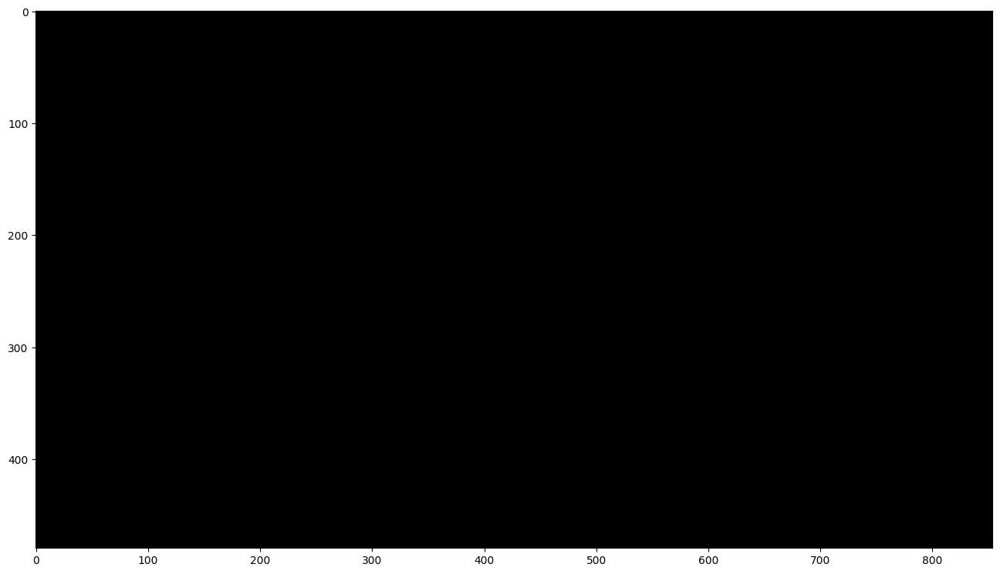

In [17]:
# create frame generator
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)
# create instance of BoxAnnotator
box_annotator = BoxAnnotator(color=ColorPalette(), thickness=4, text_thickness=4, text_scale=2)
# acquire first video frame
iterator = iter(generator)
frame = next(iterator)
# model prediction on single frame and conversion to supervision Detections
results = model(frame)
detections = Detections(
    xyxy=results[0].boxes.xyxy.cpu().numpy(),
    confidence=results[0].boxes.conf.cpu().numpy(),
    class_id=results[0].boxes.cls.cpu().numpy().astype(int)
)
# format custom labels
labels = [
    f"{CLASS_NAMES_DICT[class_id]} {confidence:0.2f}"
    for _, confidence, class_id, tracker_id
    in detections
]
# annotate and display frame
frame = box_annotator.annotate(frame=frame, detections=detections, labels=labels)

%matplotlib inline
show_frame_in_notebook(frame, (16, 16))

In [18]:
# settings
LINE_START = Point(50, 150)
LINE_END = Point(320, 150)

TARGET_VIDEO_PATH = f"{HOME}/result.mp4"

In [19]:
VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

VideoInfo(width=854, height=480, fps=30, total_frames=174)

In [22]:
import cv2
from tqdm.notebook import tqdm

# create BYTETracker instance
byte_tracker = BYTETracker(BYTETrackerArgs())
# create VideoInfo instance
video_info = VideoInfo.from_video_path(SOURCE_VIDEO_PATH)
# create frame generator
generator = get_video_frames_generator(SOURCE_VIDEO_PATH)

# open target video file
with VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
    # loop over video frames
    for frame in tqdm(generator, total=video_info.total_frames):
        # model prediction on single frame and conversion to supervision Detections
        results = model(frame)
        detections = Detections(
            xyxy=results[0].boxes.xyxy.cpu().numpy(),
            confidence=results[0].boxes.conf.cpu().numpy(),
            class_id=results[0].boxes.cls.cpu().numpy().astype(int)
        )

        # tracking detections
        tracks = byte_tracker.update(
            output_results=detections2boxes(detections=detections),
            img_info=frame.shape,
            img_size=frame.shape
        )

        # Draw bounding boxes and write coordinates on each frame
        for track in tracks:
            track_id = track.track_id
            coordinates = track.tlwh
            print(f"Track ID: {track_id}, Coordinates: {coordinates}")

            # Draw the bounding box
            bbox_color = (0, 255, 0)  # Green color
            bbox_thickness = 2
            cv2.rectangle(frame, (int(coordinates[0]), int(coordinates[1])),
                          (int(coordinates[0] + coordinates[2]), int(coordinates[1] + coordinates[3])),
                          bbox_color, bbox_thickness)

            # Calculate the center coordinates
            center_x = int(coordinates[0] + coordinates[2] / 2)
            center_y = int(coordinates[1] + coordinates[3] / 2)

            # Format the coordinates as "(..., ...)"
            formatted_coordinates = f"({center_x}, {center_y})"

            # Write the formatted coordinates on the frame above the center
            text_color = (255, 0, 0)  # Blue color
            text_scale = 0.6
            text_thickness = 1
            font = cv2.FONT_HERSHEY_SIMPLEX
            text_size, _ = cv2.getTextSize(formatted_coordinates, font, text_scale, text_thickness)
            text_x = center_x - text_size[0] // 2
            text_y = center_y - 10 if center_y >= 20 else center_y + 20

            cv2.putText(frame, formatted_coordinates, (text_x, text_y), font, text_scale, text_color, text_thickness, cv2.LINE_AA)

        # Write the annotated frame to the target video file
        sink.write_frame(frame)


  0%|          | 0/174 [00:00<?, ?it/s]


0: 384x640 (no detections), 26.2ms
Speed: 2.2ms preprocess, 26.2ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 26.0ms
Speed: 2.2ms preprocess, 26.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 26.0ms
Speed: 2.4ms preprocess, 26.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 26.0ms
Speed: 2.6ms preprocess, 26.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 23.6ms
Speed: 2.6ms preprocess, 23.6ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 20.7ms
Speed: 5.9ms preprocess, 20.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 19.3ms
Speed: 3.4ms preprocess, 19.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 19.1ms
Speed: 2.6ms preprocess, 19.1ms inference, 1.9ms post

Track ID: 3, Coordinates: [     270.97      244.74      133.81      28.706]
Track ID: 3, Coordinates: [     266.25      242.81      142.85      30.703]
Track ID: 3, Coordinates: [     253.53      237.52      167.48      36.259]
Track ID: 3, Coordinates: [     249.61         236      174.99      38.246]
Track ID: 3, Coordinates: [     249.65      235.78      174.78      38.616]
Track ID: 3, Coordinates: [     249.62       235.4      175.02      39.168]


0: 384x640 1 airplane, 16.8ms
Speed: 2.5ms preprocess, 16.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.7ms
Speed: 2.4ms preprocess, 16.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.8ms
Speed: 2.3ms preprocess, 16.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.8ms
Speed: 4.4ms preprocess, 16.8ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.5ms
Speed: 3.6ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.4ms
Speed: 2.7ms preprocess, 14.4ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)


Track ID: 3, Coordinates: [     253.45      234.17      179.24      40.528]
Track ID: 3, Coordinates: [     255.27      234.07      178.47      40.565]
Track ID: 3, Coordinates: [     250.15      234.37      175.29       40.34]
Track ID: 3, Coordinates: [     256.58      234.12      175.52      40.464]
Track ID: 3, Coordinates: [     259.28      234.08      175.15      40.447]
Track ID: 3, Coordinates: [     256.53      234.37      174.93      40.248]



0: 384x640 1 airplane, 14.4ms
Speed: 3.3ms preprocess, 14.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 4.9ms preprocess, 14.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 2.2ms preprocess, 13.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 1.6ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 15.8ms
Speed: 3.1ms preprocess, 15.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     248.25      233.97      178.35      40.788]
Track ID: 3, Coordinates: [     246.48      233.73      179.97      40.893]
Track ID: 3, Coordinates: [        245      233.53      181.56      41.011]
Track ID: 3, Coordinates: [     242.99      233.65      182.36      40.897]
Track ID: 3, Coordinates: [     241.94      233.72      183.24      40.827]
Track ID: 3, Coordinates: [        241      233.62      184.53      40.864]


0: 384x640 1 airplane, 14.0ms
Speed: 3.3ms preprocess, 14.0ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 2.4ms preprocess, 14.0ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 2.6ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.5ms
Speed: 3.3ms preprocess, 14.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 2.7ms preprocess, 13.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 3.8ms preprocess, 14.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     240.61      233.63      185.58       40.88]
Track ID: 3, Coordinates: [     242.66      233.74      185.71      40.736]
Track ID: 3, Coordinates: [     242.26      233.81       186.2      40.623]
Track ID: 3, Coordinates: [     241.18      233.76      187.19      40.668]
Track ID: 3, Coordinates: [      240.6      233.75      187.92      40.672]
Track ID: 3, Coordinates: [     241.26      233.77      188.19      40.571]


0: 384x640 1 airplane, 14.0ms
Speed: 2.3ms preprocess, 14.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 2.0ms preprocess, 13.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.2ms
Speed: 2.3ms preprocess, 14.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.9ms
Speed: 2.2ms preprocess, 13.9ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 2.3ms preprocess, 14.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.0ms
Speed: 1.9ms preprocess, 14.0ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     240.04      233.72      189.05      40.625]
Track ID: 3, Coordinates: [     237.75      232.85      193.01      41.409]
Track ID: 3, Coordinates: [     236.65      232.46       195.1      41.816]
Track ID: 3, Coordinates: [     235.52      232.03      196.79      42.195]
Track ID: 3, Coordinates: [     235.08      231.86      197.38      42.342]
Track ID: 3, Coordinates: [     234.58      231.65      198.38      42.614]
Track ID: 3, Coordinates: [     233.87       231.2      199.97       43.07]


0: 384x640 1 airplane, 14.0ms
Speed: 2.5ms preprocess, 14.0ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.4ms
Speed: 2.4ms preprocess, 16.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.7ms
Speed: 2.3ms preprocess, 13.7ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.7ms
Speed: 1.8ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.4ms
Speed: 2.6ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.3ms
Speed: 3.1ms preprocess, 13.3ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 15.1ms
Speed: 2.3ms preprocess, 15.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     234.37      231.55      198.12      42.686]
Track ID: 3, Coordinates: [     235.39      232.06      195.81      42.145]
Track ID: 3, Coordinates: [     234.53      232.02         196      42.194]
Track ID: 3, Coordinates: [     234.24      232.01      196.04      42.207]
Track ID: 3, Coordinates: [     234.35      232.09      195.59      42.098]
Track ID: 3, Coordinates: [     234.01      232.01      195.89      42.155]
Track ID: 3, Coordinates: [     233.76      231.97      195.52      42.054]


0: 384x640 1 airplane, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 19.1ms
Speed: 2.5ms preprocess, 19.1ms inference, 2.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.7ms
Speed: 11.9ms preprocess, 16.7ms inference, 9.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 16.3ms
Speed: 4.4ms preprocess, 16.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.1ms
Speed: 2.7ms preprocess, 13.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     233.44      231.89      195.73      42.089]
Track ID: 3, Coordinates: [     233.13      231.87      195.83      42.087]
Track ID: 3, Coordinates: [     233.02      231.87      195.89      42.075]
Track ID: 3, Coordinates: [      231.9      231.47      197.44      42.428]
Track ID: 3, Coordinates: [     230.61      230.78      199.76      43.012]


0: 384x640 1 airplane, 14.1ms
Speed: 2.6ms preprocess, 14.1ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.1ms
Speed: 2.2ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.1ms
Speed: 2.3ms preprocess, 13.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.0ms
Speed: 2.3ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.0ms
Speed: 2.5ms preprocess, 13.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 18.7ms
Speed: 2.1ms preprocess, 18.7ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.0ms
Speed: 2.2ms preprocess, 13.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     230.22      230.65      199.85      43.105]
Track ID: 3, Coordinates: [     231.39      231.16      197.43      42.548]
Track ID: 3, Coordinates: [     232.81      231.86      194.18      41.718]
Track ID: 3, Coordinates: [      233.2      232.13      193.24      41.399]
Track ID: 3, Coordinates: [     233.49      232.35       192.4      41.098]
Track ID: 3, Coordinates: [     233.35      232.38      192.14       40.94]
Track ID: 3, Coordinates: [     233.17      232.52      191.56      40.699]


0: 384x640 1 airplane, 25.5ms
Speed: 2.9ms preprocess, 25.5ms inference, 2.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.3ms
Speed: 2.5ms preprocess, 12.3ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 13.3ms
Speed: 2.9ms preprocess, 13.3ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 15.9ms
Speed: 2.9ms preprocess, 15.9ms inference, 2.0ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.1ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 14.2ms
Speed: 2.4ms preprocess, 14.2ms inference, 2.1ms postprocess per image at shape (1, 3, 384, 640)



Track ID: 3, Coordinates: [     233.23      232.72      191.16      40.492]
Track ID: 3, Coordinates: [     232.33      232.52      192.75      40.748]
Track ID: 3, Coordinates: [     231.89      232.44      193.57      40.849]
Track ID: 3, Coordinates: [     231.11      232.44      193.99      40.879]
Track ID: 3, Coordinates: [     230.75       232.5       193.9       40.77]
Track ID: 3, Coordinates: [     229.84      232.32      195.01      40.938]


0: 384x640 1 airplane, 12.1ms
Speed: 3.1ms preprocess, 12.1ms inference, 13.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 23.1ms
Speed: 2.4ms preprocess, 23.1ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 19.6ms
Speed: 2.4ms preprocess, 19.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


Track ID: 3, Coordinates: [     228.53      231.95      197.01      41.335]
Track ID: 3, Coordinates: [     227.49       231.9      197.56      41.453]
Track ID: 3, Coordinates: [     227.11      231.88      197.76      41.498]
Track ID: 3, Coordinates: [      227.3      231.84      196.86      41.273]
Track ID: 3, Coordinates: [     227.47      232.05      195.59      40.967]
Track ID: 3, Coordinates: [     227.84       232.3       194.6      40.698]



0: 384x640 1 airplane, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 3.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 5.7ms preprocess, 12.1ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 3.6ms preprocess, 12.2ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.0ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.4ms
Speed: 2.0ms preprocess, 12.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 2.2ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 1.8ms preprocess, 12.2ms inference, 1.4ms postprocess per image at

Track ID: 3, Coordinates: [     227.09       232.3      194.26      40.531]
Track ID: 3, Coordinates: [     224.86      231.75      197.01      41.095]
Track ID: 3, Coordinates: [     223.99      231.52      198.14      41.326]
Track ID: 3, Coordinates: [     222.56      231.15      199.98      41.723]
Track ID: 3, Coordinates: [     220.77      230.81      201.79      42.122]
Track ID: 3, Coordinates: [     220.06      230.65      202.51      42.301]
Track ID: 3, Coordinates: [     219.68      230.72      201.96      42.202]



0: 384x640 1 airplane, 12.2ms
Speed: 2.1ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 2.3ms preprocess, 12.2ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.3ms
Speed: 2.3ms preprocess, 12.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 1.9ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.1ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 1.9ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.0ms preprocess, 11.5ms inference, 1.1ms postprocess per image at

Track ID: 3, Coordinates: [     219.54       230.7      201.84        42.2]
Track ID: 3, Coordinates: [     219.53       230.7      201.72      42.197]
Track ID: 3, Coordinates: [     217.73      230.49      202.74      42.497]
Track ID: 3, Coordinates: [     216.82      230.36      203.03      42.624]
Track ID: 3, Coordinates: [     216.96      230.34      202.78      42.595]
Track ID: 3, Coordinates: [     217.38      230.47      201.53      42.292]
Track ID: 3, Coordinates: [     217.58      230.45      200.74      42.063]
Track ID: 3, Coordinates: [     217.59      230.45      200.59      41.973]
Track ID: 3, Coordinates: [     215.24      230.37      200.81       42.08]
Track ID: 3, Coordinates: [     214.98      230.39      200.49      42.008]


0: 384x640 1 airplane, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 2.1ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.4ms
Speed: 2.4ms preprocess, 12.4ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 1.9ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 2.3ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.2ms postprocess per image at 

Track ID: 3, Coordinates: [     214.99      230.24      200.53      42.021]
Track ID: 3, Coordinates: [     214.15      229.88      200.96      42.167]
Track ID: 3, Coordinates: [     213.53      229.71       201.2      42.289]
Track ID: 3, Coordinates: [     213.34      229.65      201.12       42.33]
Track ID: 3, Coordinates: [     212.81      229.46      201.77      42.563]
Track ID: 3, Coordinates: [     212.98      229.47      201.63      42.595]
Track ID: 3, Coordinates: [     212.21      229.26      202.65      42.905]
Track ID: 3, Coordinates: [     210.89      229.13      203.19      43.139]


0: 384x640 1 airplane, 11.7ms
Speed: 2.0ms preprocess, 11.7ms inference, 3.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 2.2ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 2.2ms preprocess, 12.0ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 2.0ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.5ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.1ms preprocess, 11.5ms inference, 1.5ms postprocess per image at 

Track ID: 3, Coordinates: [     210.43      228.97      203.48      43.311]
Track ID: 3, Coordinates: [     210.38       228.9      203.41      43.403]
Track ID: 3, Coordinates: [     209.76      228.69      204.01      43.664]
Track ID: 3, Coordinates: [     209.61      228.59      203.43      43.637]
Track ID: 3, Coordinates: [     209.86      228.56      203.31      43.665]
Track ID: 3, Coordinates: [     209.66      228.54      203.08      43.645]
Track ID: 3, Coordinates: [     210.02      228.56      202.16      43.469]
Track ID: 3, Coordinates: [     210.21      228.59      201.73      43.396]



0: 384x640 1 airplane, 11.8ms
Speed: 2.1ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.1ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.2ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 1.9ms preprocess, 11.8ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 1.9ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 3.3ms preprocess, 11.7ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.2ms postprocess per image at

Track ID: 3, Coordinates: [     210.54      228.56      200.92      43.211]
Track ID: 3, Coordinates: [     210.56      228.48      200.75      43.166]
Track ID: 3, Coordinates: [     210.56      228.48      200.58       43.12]
Track ID: 3, Coordinates: [     210.18      228.57      200.26      42.996]
Track ID: 3, Coordinates: [     210.06      228.51      200.06      42.901]
Track ID: 3, Coordinates: [     209.95      228.49      200.12      42.866]
Track ID: 3, Coordinates: [     210.06      228.54      200.01      42.793]
Track ID: 3, Coordinates: [     209.56      228.38         201       42.99]
Track ID: 3, Coordinates: [     209.45      228.35      200.98      42.971]



0: 384x640 1 airplane, 12.0ms
Speed: 1.7ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.0ms preprocess, 11.5ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 2.6ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 1.8ms preprocess, 12.1ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 2.0ms preprocess, 11.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.2ms postprocess per image at

Track ID: 3, Coordinates: [     208.94      228.31      201.12      42.963]
Track ID: 3, Coordinates: [     208.72      228.27      201.41          43]
Track ID: 3, Coordinates: [     208.61      228.25      201.58      43.016]
Track ID: 3, Coordinates: [     208.69      228.34      201.38      42.939]
Track ID: 3, Coordinates: [     208.56      228.44      201.25      42.861]
Track ID: 3, Coordinates: [     208.03      228.47      201.18      42.779]
Track ID: 3, Coordinates: [     207.71      228.38      201.77      42.866]
Track ID: 3, Coordinates: [     207.22      228.28       202.1      42.879]
Track ID: 3, Coordinates: [     207.08      228.24      202.34      42.882]


0: 384x640 1 airplane, 12.2ms
Speed: 2.1ms preprocess, 12.2ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 2.1ms preprocess, 12.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 2.4ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 2.1ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 2.2ms preprocess, 11.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.1ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.5ms preprocess, 11.4ms inference, 1.3ms postprocess per image at 

Track ID: 3, Coordinates: [     206.63      228.13      203.03      42.994]
Track ID: 3, Coordinates: [     205.95      227.97      204.07      43.198]
Track ID: 3, Coordinates: [     205.77      227.89      204.62      43.313]
Track ID: 3, Coordinates: [     205.89      227.98      204.38      43.245]
Track ID: 3, Coordinates: [      205.3      227.99      204.27      43.234]
Track ID: 3, Coordinates: [     205.05         228      204.35       43.27]
Track ID: 3, Coordinates: [      204.7      227.91      204.59      43.336]
Track ID: 3, Coordinates: [     204.66      227.86      204.46      43.308]



0: 384x640 1 airplane, 11.9ms
Speed: 1.9ms preprocess, 11.9ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.1ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 2.0ms preprocess, 11.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 1.8ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 1.9ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 1.8ms preprocess, 11.4ms inference, 1.2ms postprocess per image at

Track ID: 3, Coordinates: [     204.63      227.93      203.95      43.214]
Track ID: 3, Coordinates: [     203.85      227.88      204.23      43.297]
Track ID: 3, Coordinates: [     203.97      227.84      203.35      43.134]
Track ID: 3, Coordinates: [     204.06      227.82      202.95       43.07]
Track ID: 3, Coordinates: [     203.27      227.61       203.4      43.171]
Track ID: 3, Coordinates: [        203      227.58      203.48      43.189]
Track ID: 3, Coordinates: [     202.95      227.52      203.55      43.212]
Track ID: 3, Coordinates: [      202.9      227.53      203.19      43.113]
Track ID: 3, Coordinates: [     202.73      227.42      203.13      43.087]
Track ID: 3, Coordinates: [     202.61      227.38      203.18      43.084]



0: 384x640 1 airplane, 11.7ms
Speed: 1.9ms preprocess, 11.7ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.1ms preprocess, 11.5ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.0ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.2ms
Speed: 1.9ms preprocess, 12.2ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.0ms
Speed: 2.1ms preprocess, 12.0ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 1.8ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.3ms preprocess, 11.4ms inference, 1.2ms postprocess per image at

Track ID: 3, Coordinates: [     202.45      227.37      203.11      43.038]
Track ID: 3, Coordinates: [     201.67      227.21      203.88      43.178]
Track ID: 3, Coordinates: [     201.02      227.12      204.06      43.177]
Track ID: 3, Coordinates: [     200.47      227.01      204.81      43.325]
Track ID: 3, Coordinates: [     200.21      227.03      204.88      43.308]
Track ID: 3, Coordinates: [     200.08      227.04      204.99      43.301]
Track ID: 3, Coordinates: [     200.45      227.09       204.7      43.215]
Track ID: 3, Coordinates: [     199.75       226.9       205.7      43.419]
Track ID: 3, Coordinates: [     199.17      226.78      206.15      43.493]


0: 384x640 1 airplane, 11.8ms
Speed: 2.3ms preprocess, 11.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 2.3ms preprocess, 11.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 1.7ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.3ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 2.2ms preprocess, 11.7ms inference, 1.8ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1.8ms postprocess per image at 

Track ID: 3, Coordinates: [     198.96      226.77      206.41      43.527]
Track ID: 3, Coordinates: [     198.83      226.63      206.76      43.591]
Track ID: 3, Coordinates: [     198.85      226.58      206.73      43.571]
Track ID: 3, Coordinates: [     198.28      226.27       207.9      43.845]
Track ID: 3, Coordinates: [     198.07      226.11      208.33       43.96]
Track ID: 3, Coordinates: [     198.07      226.06      208.35      43.987]
Track ID: 3, Coordinates: [     198.15      226.05      208.29      43.993]
Track ID: 3, Coordinates: [     198.19      226.03      208.21      43.994]



0: 384x640 1 airplane, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 2.2ms preprocess, 11.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 1.9ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 1.8ms preprocess, 11.7ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.6ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 1.7ms preprocess, 11.5ms inference, 1.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 2.2ms preprocess, 12.1ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.8ms
Speed: 2.0ms preprocess, 11.8ms inference, 1.3ms postprocess per image at

Track ID: 3, Coordinates: [     198.24      226.02      208.12      43.993]
Track ID: 3, Coordinates: [     196.02      224.98      212.29      44.994]
Track ID: 3, Coordinates: [     194.85      224.27      214.61      45.639]
Track ID: 3, Coordinates: [      194.5      223.91      215.34      45.943]
Track ID: 3, Coordinates: [      194.9      223.74      214.85      45.964]
Track ID: 3, Coordinates: [     195.11      223.57      214.58      46.028]
Track ID: 3, Coordinates: [     195.39      223.52      214.09      46.035]
Track ID: 3, Coordinates: [      195.8      223.56      213.27      45.944]
Track ID: 3, Coordinates: [     197.47      224.23      209.94      45.205]



0: 384x640 1 airplane, 11.5ms
Speed: 2.2ms preprocess, 11.5ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 2.9ms preprocess, 11.4ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 1.9ms preprocess, 11.9ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 1.8ms preprocess, 11.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.5ms
Speed: 2.4ms preprocess, 11.5ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.4ms
Speed: 1.9ms preprocess, 11.4ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 12.1ms
Speed: 1.9ms preprocess, 12.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.7ms
Speed: 1.7ms preprocess, 11.7ms inference, 1.6ms postprocess per image at

Track ID: 3, Coordinates: [     198.72      224.56      208.15      44.771]
Track ID: 3, Coordinates: [      199.3      224.67       207.7      44.649]
Track ID: 3, Coordinates: [      199.3      224.73      207.41      44.544]
Track ID: 3, Coordinates: [     199.21      224.74      207.48      44.523]
Track ID: 3, Coordinates: [     198.73      224.52      208.34      44.705]
Track ID: 3, Coordinates: [     198.44      224.41      209.01      44.849]
Track ID: 3, Coordinates: [     198.76      224.49      208.51      44.712]
Track ID: 3, Coordinates: [     198.95      224.47      208.26      44.617]



0: 384x640 1 airplane, 11.5ms
Speed: 2.0ms preprocess, 11.5ms inference, 1.9ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.9ms
Speed: 2.0ms preprocess, 11.9ms inference, 1.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 airplane, 11.6ms
Speed: 1.6ms preprocess, 11.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


Track ID: 3, Coordinates: [     199.14      224.48      208.33      44.595]
Track ID: 3, Coordinates: [     199.13      224.48      208.48      44.595]
Track ID: 3, Coordinates: [     198.96      224.45      208.79      44.634]
Track ID: 3, Coordinates: [     198.65      224.35      209.29      44.729]


MoviePy - Building file /content/result.gif with imageio.


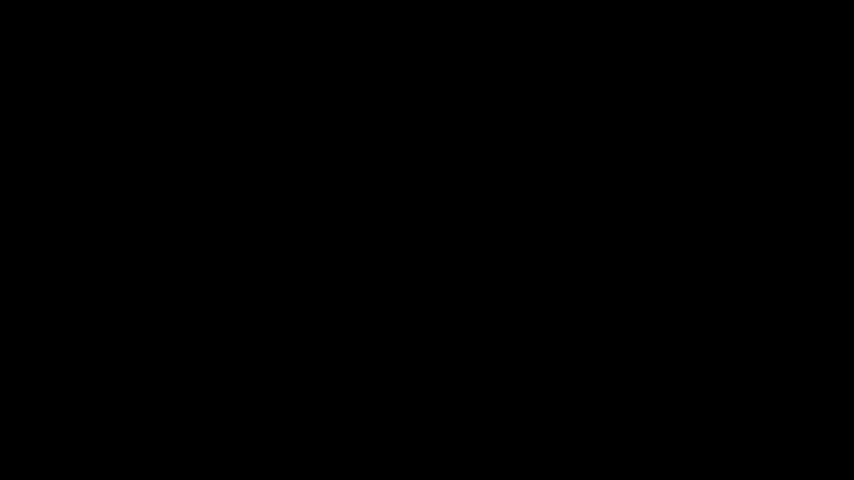

In [25]:
import moviepy.editor as mp
from IPython.display import Image

# Convert the MP4 video to GIF
video = mp.VideoFileClip("/content/result.mp4")
gif_path = "/content/result.gif"
video.write_gif(gif_path)

# Display the GIF in Colab
Image(gif_path)
